<a href="https://colab.research.google.com/github/peroza/pyfeat-webtool/blob/main/Prova_PyFeat_gallery.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Prova Py-Feat: gallery di 10 volti
prova tecnica su un’immagine generata da IA


In [ ]:
%pip install -q "git+https://github.com/cosanlab/py-feat.git"


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.6/144.6 kB 898.1 kB/s eta 0:00:00


## Upload gallery
 gallery_10_synthetic.png immagine prova


Saving gallery_10_synthetic.png to gallery_10_synthetic.png


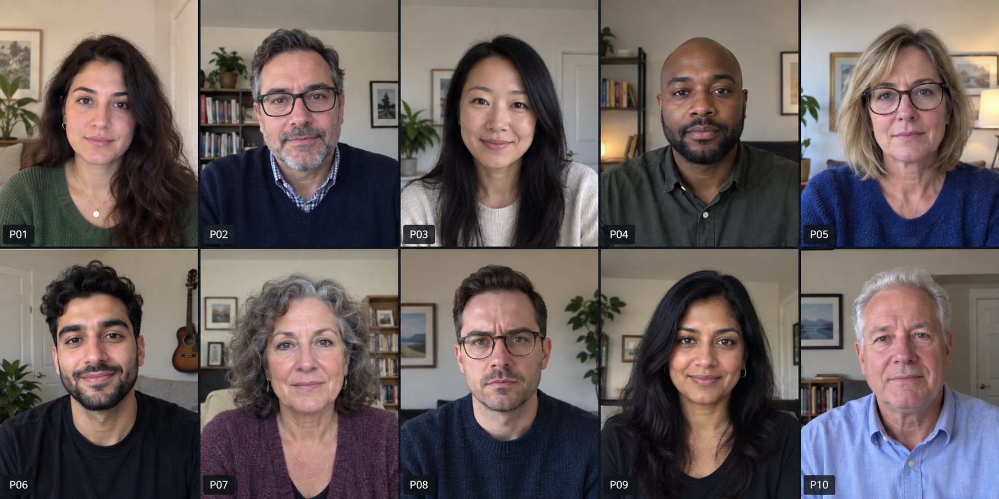

In [ ]:
from google.colab import files
from PIL import Image
from IPython.display import display
uploaded = files.upload()
image_path = next(iter(uploaded))
display(Image.open(image_path))


# Analisi dei volti con Detectorv2


In [ ]:
import torch
import importlib.metadata
from feat import Detectorv2
print("Py-Feat:", importlib.metadata.version("py-feat"))
device = "cpu" # Forcing device to CPU to resolve GPU computation error
print("Dispositivo:", device)
detector = Detectorv2(device=device)
results = detector.detect(image_path, data_type="image")
print("Volti rilevati:", len(results), "— attesi: 10")
results.to_csv("risultati_gallery.csv", index=False)
display(results)

Py-Feat: 2.1.3
Dispositivo: cpu


100%|██████████| 1/1 [00:11<00:00, 11.36s/it]

Volti rilevati: 10 — attesi: 10


,FaceRectX,FaceRectY,FaceRectWidth,FaceRectHeight,FaceScore,x_0,x_1,x_2,x_3,x_4,...,mouthStretchRight,mouthUpperUpLeft,mouthUpperUpRight,noseSneerLeft,noseSneerRight,FrameHeight,FrameWidth,input,frame,Identity
0,1142.135620,511.584625,222.535156,222.535126,0.999923,1185.083862,1184.176758,1184.260620,1185.858398,1189.113892,...,0.006607,0.004799,0.007494,1.645766e-06,1.686314e-06,887.0,1774.0,gallery_10_synthetic.png,0,Person_0
1,72.375923,92.816368,217.570343,217.570312,0.999923,117.143829,115.767502,115.386414,116.286774,118.185272,...,0.006003,0.000417,0.000356,1.376135e-06,1.111594e-06,887.0,1774.0,gallery_10_synthetic.png,0,Person_1
2,1499.510498,79.543121,222.298462,222.298431,0.999911,1540.984741,1542.533325,1544.885132,1548.664673,1553.756714,...,0.003341,0.000029,0.000025,3.448327e-07,4.585855e-07,887.0,1774.0,gallery_10_synthetic.png,0,Person_2
3,764.342773,78.330742,237.564026,237.563995,0.999837,817.508606,816.602356,816.714478,818.488220,821.400635,...,0.007460,0.000898,0.000942,1.694529e-06,7.031666e-07,887.0,1774.0,gallery_10_synthetic.png,0,Person_3
4,53.776230,505.514771,235.604874,235.604858,0.999798,100.135818,101.502899,103.145943,106.364113,111.514618,...,0.005029,0.003242,0.003864,9.964157e-07,8.285920e-07,887.0,1774.0,gallery_10_synthetic.png,0,Person_4
5,1129.286499,70.320946,233.377075,233.377106,0.999765,1173.495117,1173.772949,1174.265259,1176.410034,1181.085938,...,0.017534,0.000475,0.000565,3.560094e-06,2.621448e-06,887.0,1774.0,gallery_10_synthetic.png,0,Person_5
6,768.835327,505.040436,240.836853,240.836884,0.999695,817.564453,818.962097,820.632568,823.670715,828.224243,...,0.001147,0.000013,0.000010,2.992889e-07,1.685764e-07,887.0,1774.0,gallery_10_synthetic.png,0,Person_6
7,427.290558,518.435608,231.334076,231.334045,0.999669,471.481140,471.949188,473.600311,476.950836,481.924072,...,0.008084,0.000086,0.000077,4.007208e-07,4.698641e-07,887.0,1774.0,gallery_10_synthetic.png,0,Person_7
8,1477.710815,491.118164,253.631348,253.631348,0.999593,1529.048950,1530.367798,1532.028198,1535.639893,1541.048096,...,0.018856,0.000066,0.000077,2.418502e-07,2.480856e-07,887.0,1774.0,gallery_10_synthetic.png,0,Person_8
9,410.685944,78.269997,239.765106,239.765106,0.999543,458.010132,459.676880,461.886292,465.733063,471.710571,...,0.004984,0.000017,0.000021,1.734818e-07,1.263993e-07,887.0,1774.0,gallery_10_synthetic.png,0,Person_9


## Controllo dei riquadri
I numeri D sono rilevamenti, non identità riconosciute. ora controllo che ciascuno dei dieci volti abbia esattamente un riquadro.


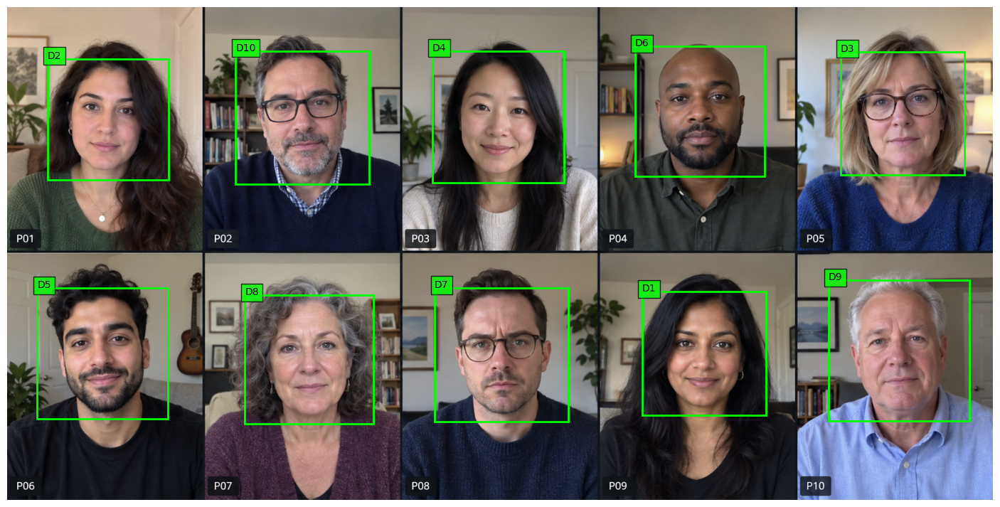

,FaceScore,valence,arousal
0,0.999923,0.735728,-0.085774
1,0.999923,0.563837,-0.116557
2,0.999911,0.265063,-0.090284
3,0.999837,0.767616,-0.099641
4,0.999798,0.728854,-0.059447
5,0.999765,0.230671,-0.091605
6,0.999695,-0.456150,0.463264
7,0.999669,0.545765,-0.096934
8,0.999593,0.507900,-0.137724
9,0.999543,0.450899,-0.137406


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
fig, ax = plt.subplots(figsize=(18, 9))
ax.imshow(Image.open(image_path))
for i, (_, row) in enumerate(results.iterrows(), 1):
    x, y, w, h = [float(row[k]) for k in ["FaceRectX", "FaceRectY", "FaceRectWidth", "FaceRectHeight"]]
    ax.add_patch(Rectangle((x,y),w,h,fill=False,edgecolor="lime",linewidth=2))
    ax.text(x,y,f"D{i}",color="black",bbox=dict(facecolor="lime",alpha=.8))
ax.axis("off")
plt.show()
cols = [c for c in ["FaceScore", "anger", "disgust", "fear", "happiness", "sadness", "surprise", "neutral", "valence", "arousal"] if c in results.columns]
display(results[cols])
files.download("risultati_gallery.csv")


In [ ]:
print(results.emotions.to_string())

    Neutral     Happy       Sad  Surprise      Fear   Disgust     Anger
0  0.017797  0.980694  0.000476  0.000419  0.000025  0.000437  0.000151
1  0.220423  0.774070  0.002034  0.002323  0.000045  0.000663  0.000441
2  0.640547  0.333699  0.010786  0.002154  0.000193  0.003170  0.009452
3  0.008712  0.990450  0.000270  0.000442  0.000010  0.000090  0.000027
4  0.019477  0.978535  0.000599  0.000855  0.000028  0.000421  0.000086
5  0.782696  0.207278  0.006921  0.001577  0.000027  0.000264  0.001235
6  0.143824  0.001276  0.025391  0.001028  0.001167  0.011165  0.816149
7  0.216177  0.758596  0.010242  0.007146  0.000445  0.003222  0.004172
8  0.296506  0.689580  0.007713  0.000977  0.000079  0.000989  0.004157
9  0.360940  0.631156  0.003863  0.001212  0.000035  0.000714  0.002082


# Prova 2

# Upload gallery
 immagine prova 2

Saving gallery_product_prova2.png to gallery_product_prova2.png


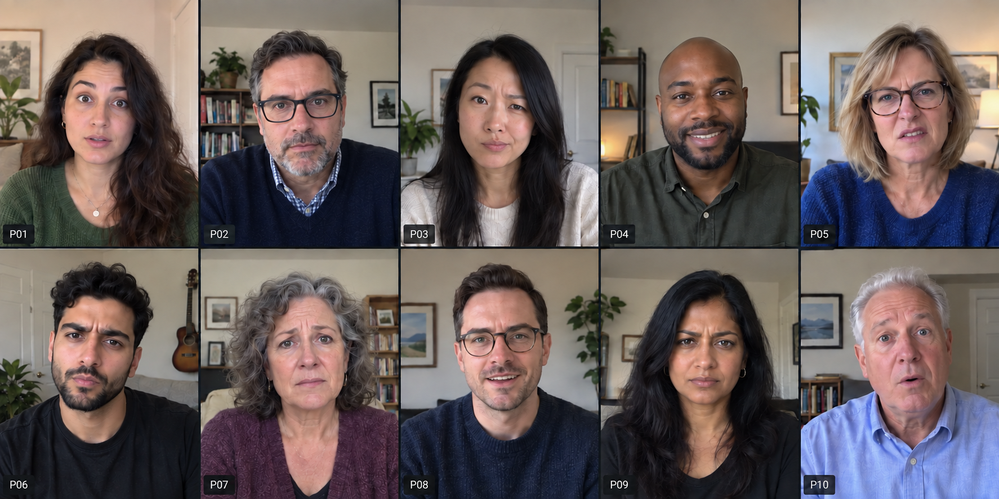

In [ ]:
from google.colab import files
from PIL import Image
from IPython.display import display
uploaded = files.upload()
image_path = next(iter(uploaded))
display(Image.open(image_path))

# Analisi dei volti con Detectorv2 pt.2

In [ ]:
import torch
import importlib.metadata
from feat import Detectorv2
print("Py-Feat:", importlib.metadata.version("py-feat"))
device = "cpu" # Forcing device to CPU to resolve GPU computation error
print("Dispositivo:", device)
detector = Detectorv2(device=device)
results = detector.detect(image_path, data_type="image")
print("Volti rilevati:", len(results), "— attesi: 10")
results.to_csv("risultati_gallery2.csv", index=False)
display(results)

Py-Feat: 2.1.3
Dispositivo: cpu


100%|██████████| 1/1 [00:10<00:00, 10.07s/it]

Volti rilevati: 10 — attesi: 10


,FaceRectX,FaceRectY,FaceRectWidth,FaceRectHeight,FaceScore,x_0,x_1,x_2,x_3,x_4,...,mouthStretchRight,mouthUpperUpLeft,mouthUpperUpRight,noseSneerLeft,noseSneerRight,FrameHeight,FrameWidth,input,frame,Identity
0,72.652847,93.984375,213.665756,213.665741,0.999907,116.082062,114.700874,114.087219,115.178345,117.390991,...,0.001044,0.003785,0.002776,1.924549e-06,7.350565e-07,887.0,1774.0,gallery_product_prova2.png,0,Person_0
1,1502.736206,82.979118,219.692993,219.692993,0.999879,1543.234985,1545.726318,1549.058716,1553.959595,1560.067749,...,0.004029,0.165871,0.084063,2.386549e-06,2.096696e-06,887.0,1774.0,gallery_product_prova2.png,0,Person_1
2,1145.039185,517.535522,215.501709,215.501709,0.999877,1183.463501,1182.625366,1183.071777,1185.035400,1188.425171,...,0.016026,0.001173,0.001562,3.336114e-06,1.831913e-06,887.0,1774.0,gallery_product_prova2.png,0,Person_2
3,51.923752,513.852173,227.348282,227.348267,0.999827,98.573456,95.503067,92.727692,91.063919,91.043816,...,0.000102,0.000011,0.000012,5.437265e-07,1.928126e-07,887.0,1774.0,gallery_product_prova2.png,0,Person_3
4,766.000854,85.645164,230.944336,230.944336,0.999700,816.861267,815.265198,814.844849,815.731384,817.390503,...,0.001127,0.000162,0.000024,1.623729e-06,3.923294e-07,887.0,1774.0,gallery_product_prova2.png,0,Person_4
5,767.080200,502.965851,243.981384,243.981415,0.999654,816.763794,818.233093,820.008850,823.342529,828.563354,...,0.005153,0.088330,0.072481,6.863658e-07,5.801666e-07,887.0,1774.0,gallery_product_prova2.png,0,Person_5
6,426.792603,510.807373,233.541992,233.541992,0.999588,471.739227,473.401001,476.262024,480.752014,486.947479,...,0.002110,0.000032,0.000024,5.554269e-07,5.881142e-07,887.0,1774.0,gallery_product_prova2.png,0,Person_6
7,1127.285156,76.246277,240.721680,240.721741,0.999557,1171.735474,1173.037842,1174.436523,1177.687500,1183.625366,...,0.012081,0.156704,0.148769,2.030591e-06,2.110542e-06,887.0,1774.0,gallery_product_prova2.png,0,Person_7
8,408.407837,81.823738,246.913940,246.913940,0.999364,458.706512,460.608246,462.838470,466.745544,472.667023,...,0.001148,0.000007,0.000006,1.367277e-07,8.380356e-08,887.0,1774.0,gallery_product_prova2.png,0,Person_8
9,1481.894775,492.991882,251.942505,251.942505,0.999320,1529.487793,1532.110474,1535.146851,1540.466553,1548.374390,...,0.000015,0.000002,0.000003,4.538086e-07,3.308863e-07,887.0,1774.0,gallery_product_prova2.png,0,Person_9


## Controllo dei riquadri
I numeri D sono rilevamenti, non identità riconosciute. ora controllo che ciascuno dei dieci volti abbia esattamente un riquadro.


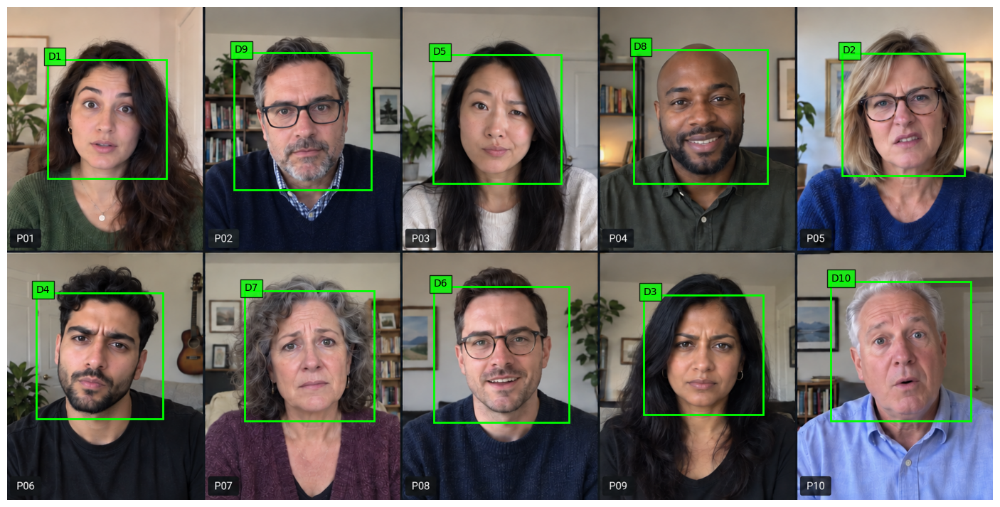

,FaceScore,valence,arousal
0,0.999907,0.139142,0.813351
1,0.999879,-0.704638,0.614433
2,0.999877,-0.516072,0.461312
3,0.999827,-0.515031,0.471988
4,0.999700,-0.442349,0.238247
5,0.999654,0.652541,0.049112
6,0.999588,-0.700592,-0.402089
7,0.999557,0.765209,0.100734
8,0.999364,-0.142652,-0.018671
9,0.999320,0.005917,0.668420


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
fig, ax = plt.subplots(figsize=(18, 9))
ax.imshow(Image.open(image_path))
for i, (_, row) in enumerate(results.iterrows(), 1):
    x, y, w, h = [float(row[k]) for k in ["FaceRectX", "FaceRectY", "FaceRectWidth", "FaceRectHeight"]]
    ax.add_patch(Rectangle((x,y),w,h,fill=False,edgecolor="lime",linewidth=2))
    ax.text(x,y,f"D{i}",color="black",bbox=dict(facecolor="lime",alpha=.8))
ax.axis("off")
plt.show()
cols = [c for c in ["FaceScore", "anger", "disgust", "fear", "happiness", "sadness", "surprise", "neutral", "valence", "arousal"] if c in results.columns]
display(results[cols])
files.download("risultati_gallery2.csv")


In [ ]:
print(results.emotions.to_string())


    Neutral     Happy       Sad  Surprise      Fear   Disgust     Anger
0  0.012829  0.006426  0.000811  0.954592  0.023123  0.001146  0.001073
1  0.002165  0.000488  0.002760  0.000421  0.000472  0.971700  0.021994
2  0.068488  0.002847  0.098625  0.000385  0.001774  0.072979  0.754902
3  0.045694  0.001005  0.029393  0.000955  0.001292  0.017603  0.904059
4  0.164187  0.069600  0.348830  0.024614  0.014285  0.213642  0.164841
5  0.043524  0.941827  0.001687  0.003630  0.000457  0.006474  0.002401
6  0.033664  0.000706  0.929463  0.001722  0.020655  0.010828  0.002962
7  0.013909  0.980932  0.000618  0.003600  0.000126  0.000666  0.000148
8  0.883819  0.014716  0.023101  0.007790  0.002983  0.001281  0.066309
9  0.034818  0.002018  0.019331  0.675190  0.255986  0.003710  0.008947
